## Percobaan 1

Grayscsale, Resize, Ekualisasi, Median

In [1]:
import os
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_predict
from sklearn.metrics import accuracy_score, classification_report
from skimage.feature import graycomatrix, graycoprops
from scipy.stats import entropy
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
from sklearn.metrics import (confusion_matrix, ConfusionMatrixDisplay)
import seaborn as sns

Kode tersebut menyiapkan semua library yang dibutuhkan untuk klasifikasi citra, mulai dari pemrosesan gambar, ekstraksi fitur, hingga evaluasi model menggunakan algoritma seperti Random Forest, SVM, dan KNN.

## Data Loading

In [2]:
data = []
labels = []
file_name = []

for sub_folder in os.listdir("dataset\\"):
    sub_folder_files = os.listdir(os.path.join("dataset\\", sub_folder))
    for i, filename in enumerate(sub_folder_files):
        img_path = os.path.join("dataset\\", sub_folder, filename)
        img = cv.imread(img_path)
        if img is not None:
            img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)  # Konversi ke grayscale
            img = cv.resize(img, (150, 150))           # Resize ke ukuran tetap
            img = img.astype(np.uint8)                 # Tipe data sesuai

            data.append(img)
            labels.append(sub_folder)
            file_name.append(filename)

data = np.array(data)
labels = np.array(labels)


Potongan kode diatas tersebut berfungsi untuk membaca dan menyiapkan data citra dari folder `dataset\\` guna digunakan dalam proses klasifikasi. Setiap subfolder di dalam direktori `dataset\\` diasumsikan sebagai label kelas, dan berisi gambar-gambar yang termasuk dalam kelas tersebut. Setiap gambar dibaca menggunakan OpenCV (`cv.imread`), dikonversi ke format grayscale agar lebih sederhana dan efisien untuk analisis, lalu di-*resize* ke ukuran 150x150 piksel agar semua citra memiliki dimensi yang seragam. Data citra yang telah diproses dimasukkan ke dalam list `data`, label kelasnya ke `labels`, dan nama file disimpan di `file_name`. Setelah seluruh gambar selesai diproses, list `data` dan `labels` dikonversi menjadi array NumPy untuk memudahkan pemrosesan selanjutnya menggunakan pustaka machine learning.


## Data Preparation

### Define Preprocessing

In [3]:
def histogram_equalization(img_gray):
    hist, bins = np.histogram(img_gray.flatten(), bins=256, range=[0,255])
    cdf = hist.cumsum()
    cdf_normalized = cdf * 255 / cdf[-1]
    img_eq = np.interp(img_gray.flatten(), bins[:-1], cdf_normalized)
    return img_eq.reshape(img_gray.shape).astype(np.uint8)

def median(arr):
    n = len(arr)
    sorted_arr = sorted(arr)
    if n % 2 == 0:
        median1 = sorted_arr[n//2]
        median2 = sorted_arr[n//2 - 1]
        median = (median1 + median2)/2
    else:
        median = sorted_arr[n//2]
        
    return median

def filter_median(image, kernel):
    # mengambil nilai shape dari variabel image dan kernel 
    heightImage, widthImage = image.shape
    heightKernel, widthKernel = kernel.shape
    # melakukan perhitungan untuk mencari nilai tengah 
    heigthCenter = int((heightKernel - 1)/2)
    widthCenter = int((widthKernel - 1)/2)

    # proses padding 
    leftPad = widthCenter
    rightPad = widthKernel - widthCenter
    topPad = heigthCenter
    botPad = heightKernel - heigthCenter
    image = np.pad(image, ((leftPad, rightPad), (topPad, botPad)), mode='edge')

    result = np.zeros([heightImage, widthImage])
    # proses konvolusi
    for i in range(heightImage):
         for j in range(widthImage):
             temp = np.zeros(len(kernel)*len(kernel))
             indeks = 0
             for k in range(heightKernel):
                 for l in range(widthKernel):
                     temp[indeks] += image[i+k,j+l]
                     indeks+=1
                     result[i,j] = median(temp)
             
    return np.clip(result, 0, 255).astype(np.uint8)


## Preprocessing

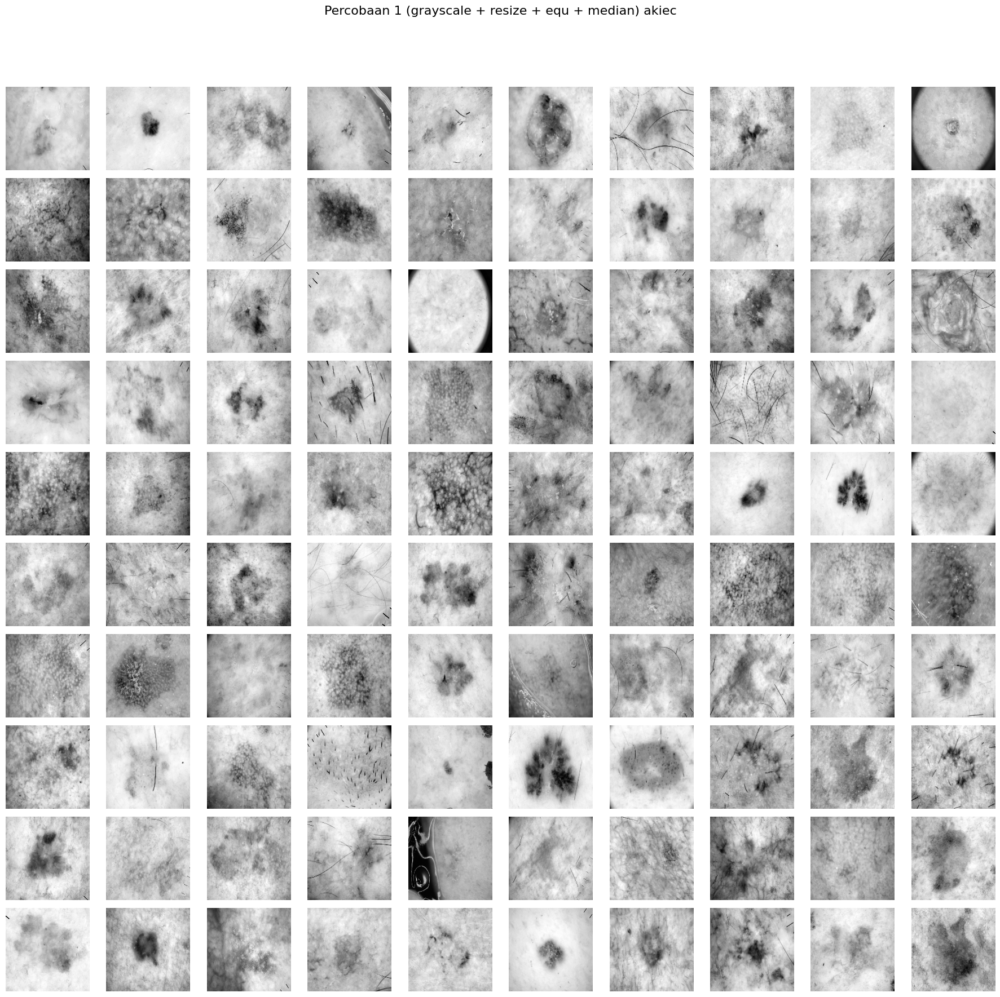

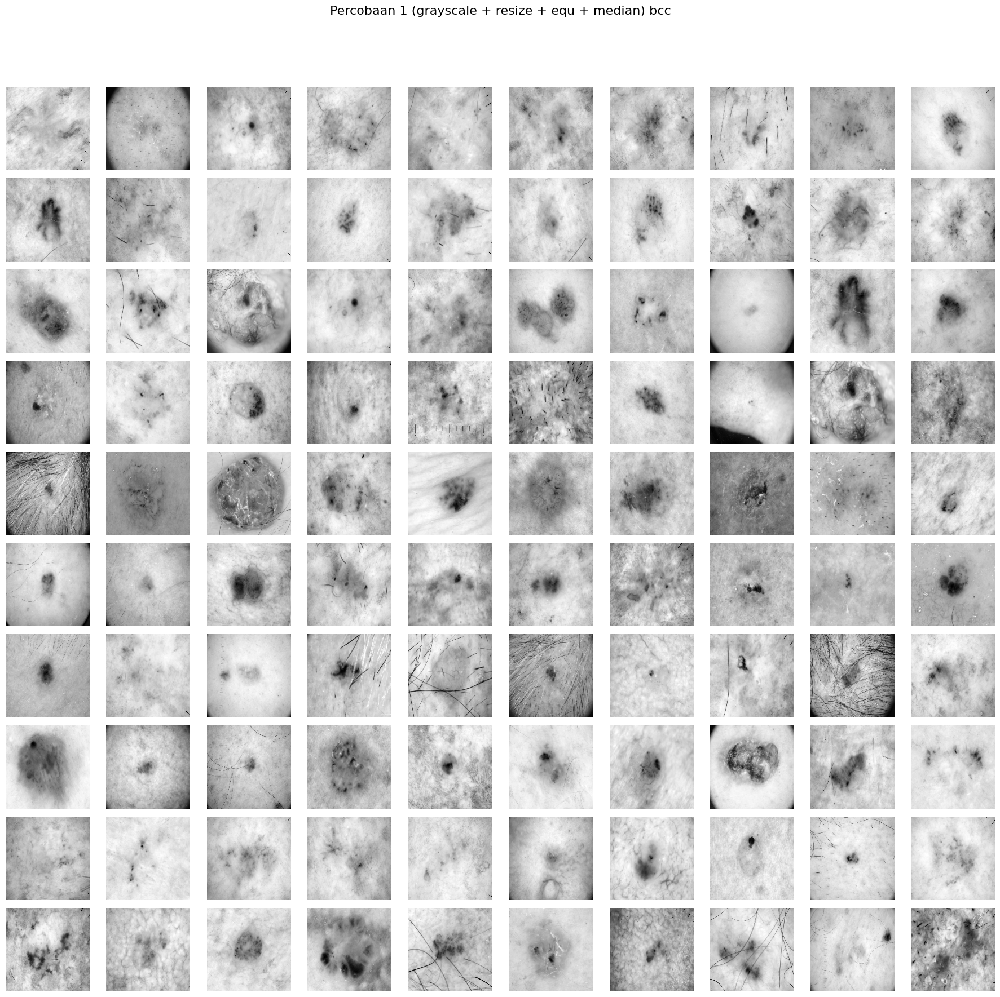

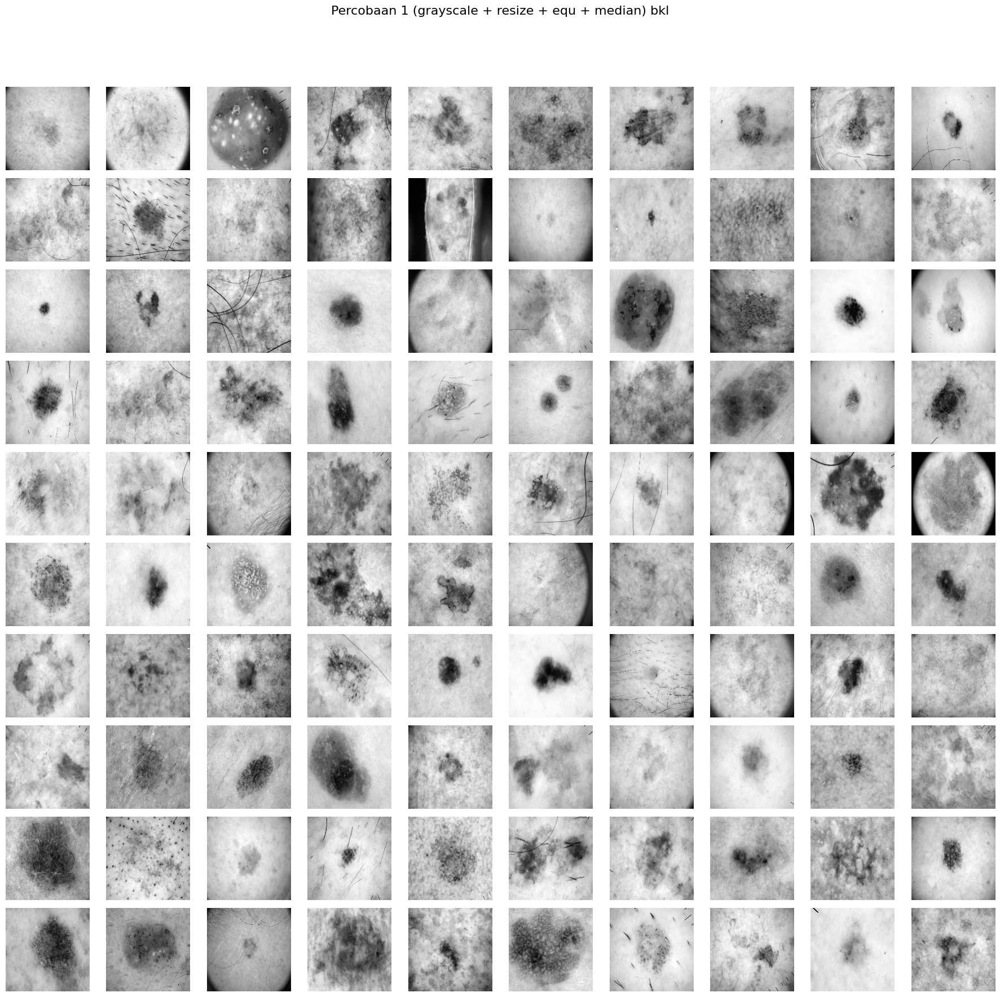

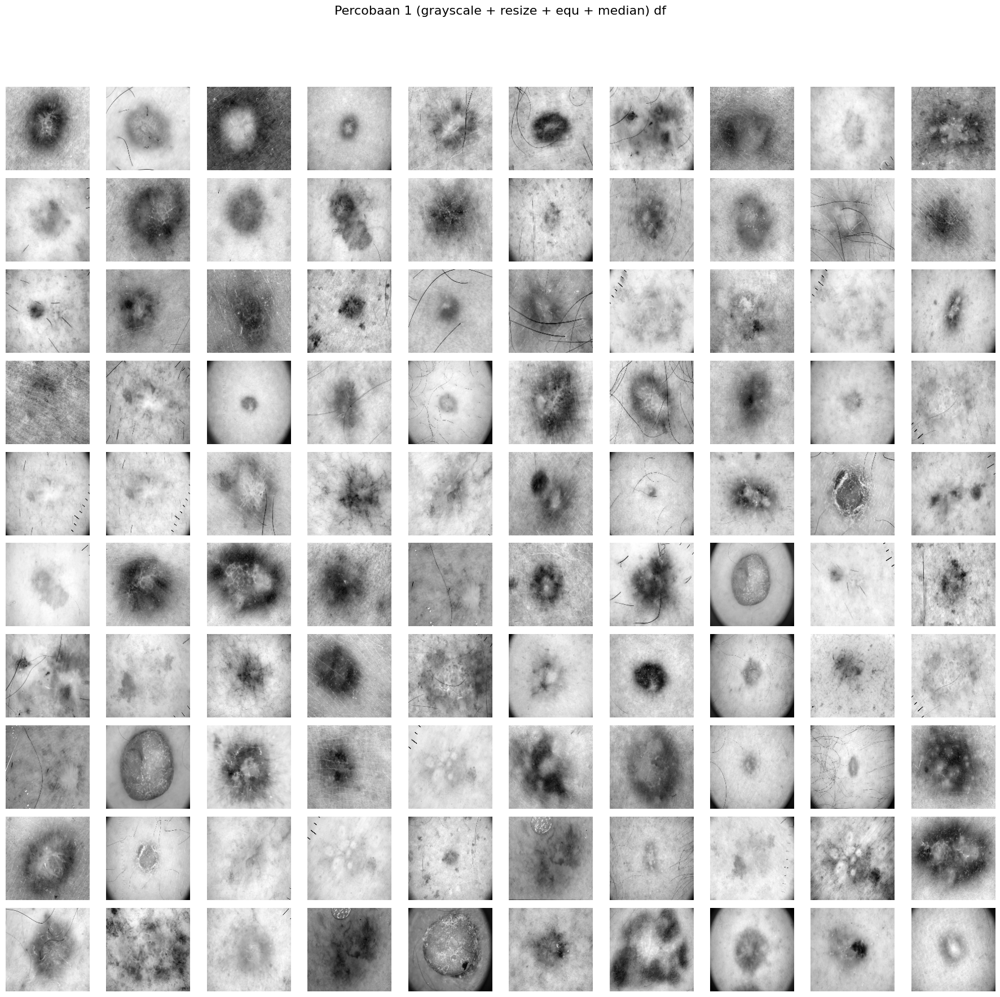

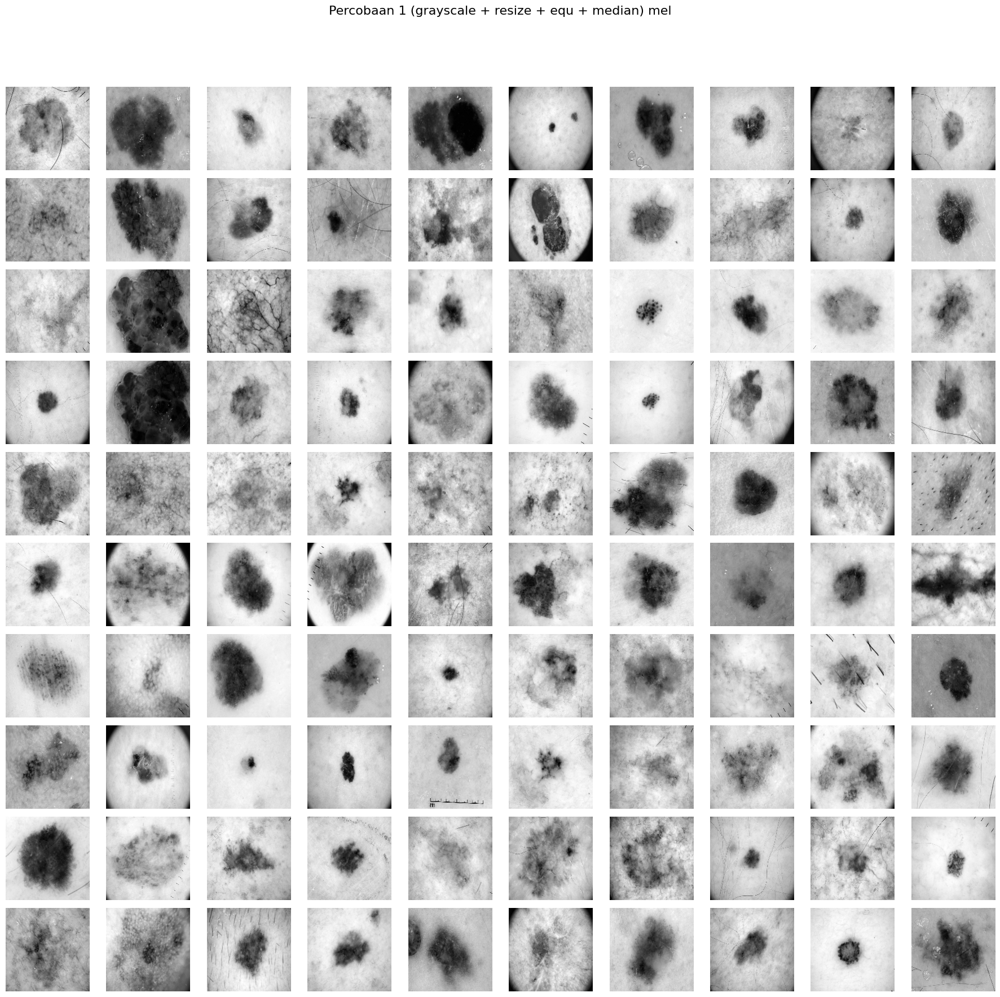

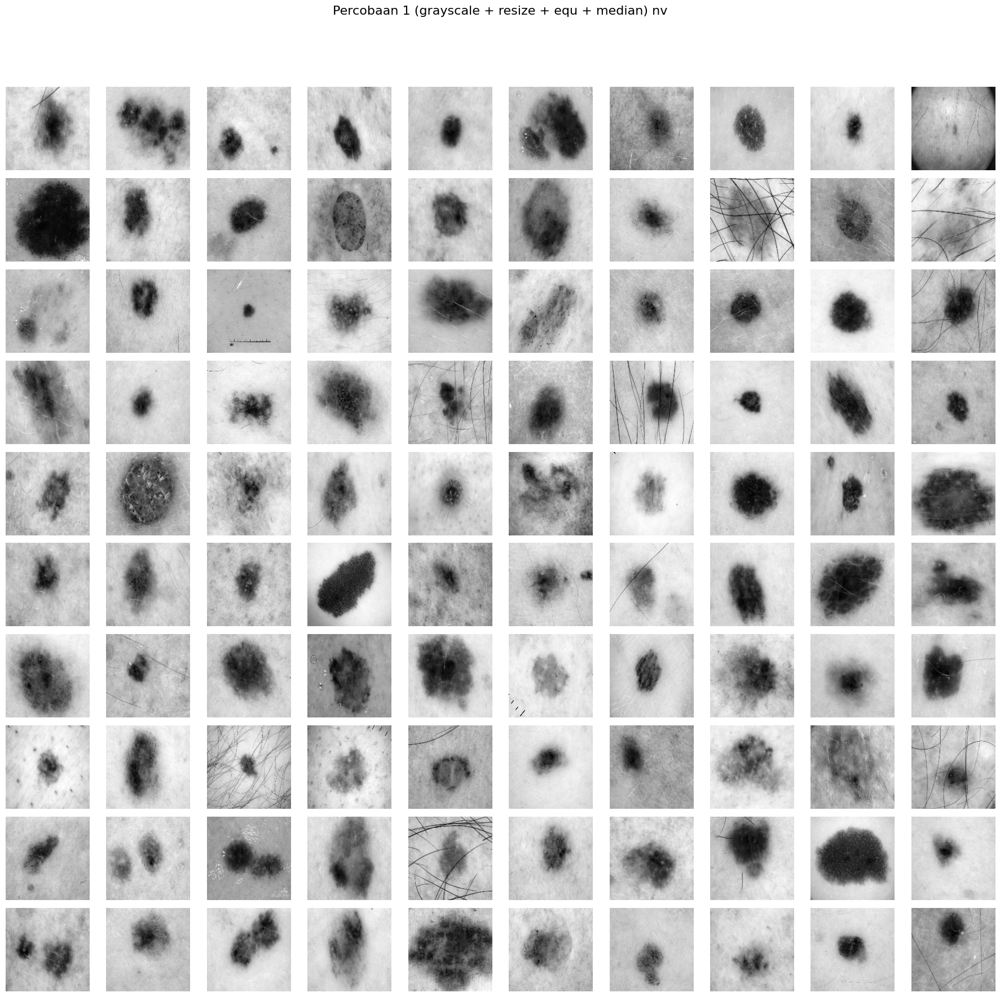

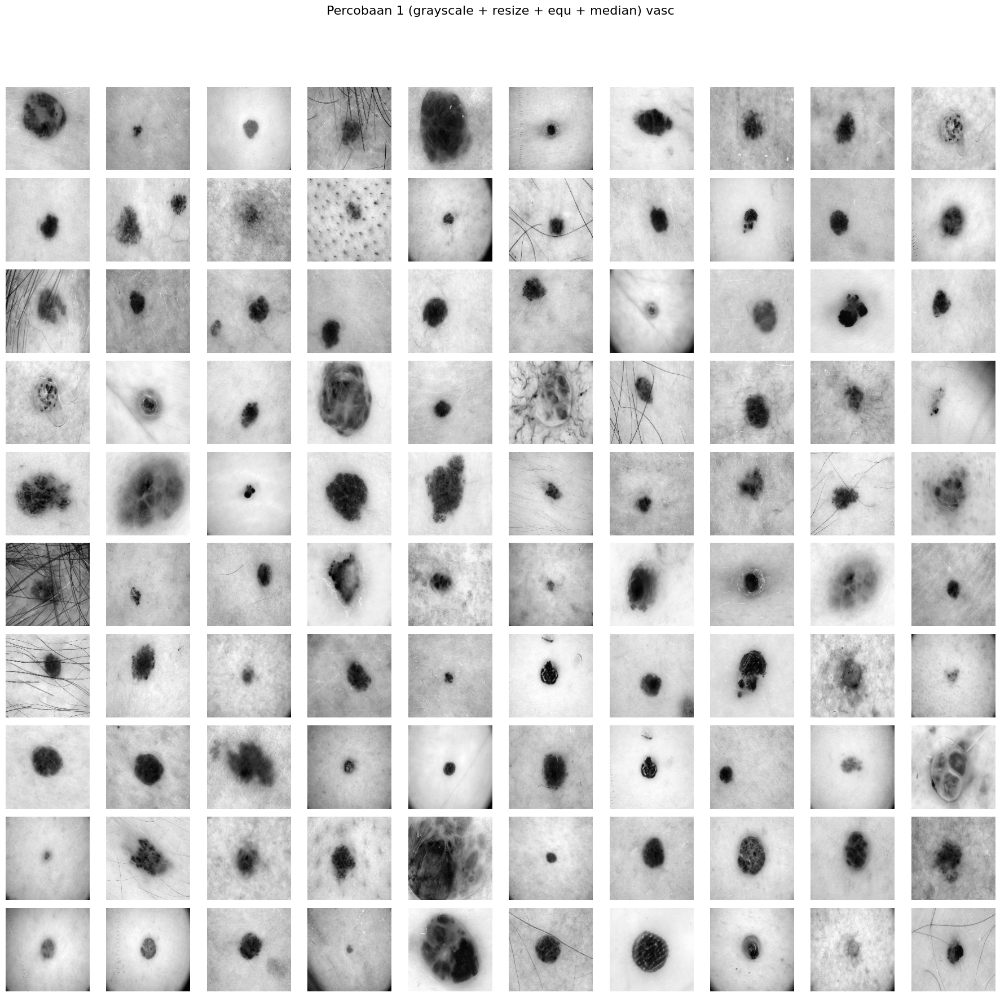

In [4]:
def percobaan1(gray):
    img_eq = histogram_equalization(gray)
    img_median = filter_median(img_eq, np.ones((3, 3))).astype(np.uint8)
    return img_median

dataPreprocessed = [percobaan1(img) for img in data]  

unique_labels = sorted(set(labels))

for label in unique_labels:
    idxs = [j for j, l in enumerate(labels) if l == label]
    n_imgs = min(100, len(idxs))
    fig, axs = plt.subplots(10, 10, figsize=(18, 18))
    fig.suptitle(f'Percobaan 1 (grayscale + resize + equ + median) {label}', fontsize=16)
    
    for k in range(100):
        row = k // 10
        col = k % 10
        ax = axs[row][col]
        if k < n_imgs:
            ax.imshow(data[idxs[k]], cmap='gray')
        ax.axis('off')
        
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()


## Ekstraksi Fitur

In [19]:
def glcm(image, derajat):
    if derajat == 0:
        angles = [0]
    elif derajat == 45:
        angles = [np.pi / 4]
    elif derajat == 90:
        angles = [np.pi / 2]
    elif derajat == 135:
        angles = [3 * np.pi / 4]
    else:
        raise ValueError("Invalid angle. It should be one of the following: 0, 45, 90, 135.")
    
    # mengembalikan matrix glcm dari image
    glcm = graycomatrix(image, [1], angles, 256, symmetric=True, normed=True)
    
    return glcm

In [6]:
def correlation(matriks):
	return graycoprops(matriks, 'correlation')[0, 0]

def dissimilarity(matriks):
    return graycoprops(matriks, 'dissimilarity')[0, 0]

def homogenity(matriks):
    return graycoprops(matriks, 'homogeneity')[0, 0]

def contrast(matriks):
    return graycoprops(matriks, 'contrast')[0, 0]

def ASM(matriks):
    return graycoprops(matriks, 'ASM')[0, 0]

def energy(matriks):
    return graycoprops(matriks, 'energy')[0, 0]

def entropyGlcm(matriks):
    return entropy(matriks.ravel())

In [7]:
# Fungsi ekstraksi fitur untuk list citra
def ekstrak_fitur_glcm(data, nama_prepro):
    fitur_list = []
    for img in data:
        img_u8 = img.astype(np.uint8)
        m = glcm(img_u8, 0)  # derajat 0
        
        fitur = {
            'contrast': contrast(m),
            'correlation': correlation(m),
            'energy': energy(m),
            'homogeneity': homogenity(m),
            'dissimilarity': dissimilarity(m),
            'ASM': ASM(m),
            'entropy': entropyGlcm(m)
        }
        fitur_list.append(fitur)

    df = pd.DataFrame(fitur_list)
    df['tahap'] = nama_prepro
    return df

df2 = ekstrak_fitur_glcm(dataPreprocessed, 'percobaan6')
display(df2)

,contrast,correlation,energy,homogeneity,dissimilarity,ASM,entropy,tahap
0,124.445324,0.988577,0.054624,0.333377,7.104474,0.002984,6.305768,percobaan6
1,184.863266,0.983183,0.107836,0.474279,7.970470,0.011629,5.014430,percobaan6
2,173.811275,0.983902,0.051192,0.314996,8.296376,0.002621,6.468494,percobaan6
3,121.346488,0.989058,0.050531,0.353970,6.423624,0.002553,6.593851,percobaan6
4,272.120134,0.974784,0.096820,0.419782,9.434944,0.009374,5.303340,percobaan6
...,...,...,...,...,...,...,...,...
1252,205.393691,0.981509,0.077078,0.369784,8.883266,0.005941,5.717732,percobaan6
1253,70.960447,0.993694,0.054700,0.337629,5.456286,0.002992,6.416376,percobaan6
1254,107.291544,0.990548,0.105015,0.485565,6.099597,0.011028,5.168336,percobaan6
1255,163.500671,0.985169,0.052449,0.350743,7.565727,0.002751,6.443283,percobaan6


In [8]:
Derajat0 = []
Derajat45 = []
Derajat90 = []
Derajat135 = []
for i in range(len(dataPreprocessed)):
    D0 = glcm(dataPreprocessed[i], 0)
    D45 = glcm(dataPreprocessed[i], 45)
    D90 = glcm(dataPreprocessed[i], 90)
    D135 = glcm(dataPreprocessed[i], 135)
    Derajat0.append(D0)
    Derajat45.append(D45)
    Derajat90.append(D90)
    Derajat135.append(D135)

Kontras0, Kontras45, Kontras90, Kontras135 = [], [], [], []
dissimilarity0, dissimilarity45, dissimilarity90, dissimilarity135 =  [], [], [], []
homogenity0, homogenity45, homogenity90, homogenity135 = [], [], [], []
entropy0, entropy45, entropy90, entropy135 =  [], [], [], []
ASM0, ASM45, ASM90, ASM135 =  [], [], [], []
energy0, energy45, energy90, energy135 =  [], [], [], []
correlation0, correlation45, correlation90, correlation135 = [], [], [], []

for i in range(len(dataPreprocessed)):
    C0 = correlation(Derajat0[i])
    correlation0.append(C0)
    C45 = correlation(Derajat45[i])
    correlation45.append(C45)
    C90 = correlation(Derajat90[i])
    correlation90.append(C90)
    C135 = correlation(Derajat135[i])
    correlation135.append(C135)

for i in range(len(data)):
    K0 = contrast(Derajat0[i])
    K45 = contrast(Derajat45[i])
    K90 = contrast(Derajat90[i])
    K135 = contrast(Derajat135[i])
    Kontras0.append(K0)
    Kontras45.append(K45)
    Kontras90.append(K90)
    Kontras135.append(K135)

for i in range(len(data)):
    Dis0 = dissimilarity(Derajat0[i])
    Dis45 = dissimilarity(Derajat45[i])
    Dis90 = dissimilarity(Derajat90[i])
    Dis135 = dissimilarity(Derajat135[i])
    dissimilarity0.append(Dis0)
    dissimilarity45.append(Dis45)
    dissimilarity90.append(Dis90)
    dissimilarity135.append(Dis135)

for i in range(len(data)):
    H0 = homogenity(Derajat0[i])
    H45 = homogenity(Derajat45[i])
    H90 = homogenity(Derajat90[i])
    H135 = homogenity(Derajat135[i])
    homogenity0.append(H0)
    homogenity45.append(H45)
    homogenity90.append(H90)
    homogenity135.append(H135)

for i in range(len(data)):  
    E0 = entropyGlcm(Derajat0[i])
    E45 = entropyGlcm(Derajat45[i])
    E90 = entropyGlcm(Derajat90[i])
    E135 = entropyGlcm(Derajat135[i])
    entropy0.append(E0)
    entropy45.append(E45)
    entropy90.append(E90)
    entropy135.append(E135)

for i in range(len(data)):
    A0 = ASM(Derajat0[i])
    A45 = ASM(Derajat45[i])
    A90 = ASM(Derajat90[i])
    A135 = ASM(Derajat135[i])
    ASM0.append(A0)
    ASM45.append(A45)
    ASM90.append(A90)
    ASM135.append(A135)

for i in range(len(data)):
    ER0 = energy(Derajat0[i])
    ER45 = energy(Derajat45[i])
    ER90 = energy(Derajat90[i])
    ER135 = energy(Derajat135[i])
    energy0.append(ER0)
    energy45.append(ER45)
    energy90.append(ER90)
    energy135.append(ER135)



## Hasil Ekstraksi to CSV

In [9]:
features = []

for i in range(len(dataPreprocessed)):
    fitur = [
        contrast(Derajat0[i]), contrast(Derajat45[i]), contrast(Derajat90[i]), contrast(Derajat135[i]),
        dissimilarity(Derajat0[i]), dissimilarity(Derajat45[i]), dissimilarity(Derajat90[i]), dissimilarity(Derajat135[i]),
        homogenity(Derajat0[i]), homogenity(Derajat45[i]), homogenity(Derajat90[i]), homogenity(Derajat135[i]),
        entropyGlcm(Derajat0[i]), entropyGlcm(Derajat45[i]), entropyGlcm(Derajat90[i]), entropyGlcm(Derajat135[i]),
        ASM(Derajat0[i]), ASM(Derajat45[i]), ASM(Derajat90[i]), ASM(Derajat135[i]),
        energy(Derajat0[i]), energy(Derajat45[i]), energy(Derajat90[i]), energy(Derajat135[i]),
        correlation(Derajat0[i]), correlation(Derajat45[i]), correlation(Derajat90[i]), correlation(Derajat135[i]),
    ]
    features.append(fitur)

# Buat dataframe
columns = [
    "contrast_0", "contrast_45", "contrast_90", "contrast_135",
    "dissimilarity_0", "dissimilarity_45", "dissimilarity_90", "dissimilarity_135",
    "homogeneity_0", "homogeneity_45", "homogeneity_90", "homogeneity_135",
    "entropy_0", "entropy_45", "entropy_90", "entropy_135",
    "ASM_0", "ASM_45", "ASM_90", "ASM_135",
    "energy_0", "energy_45", "energy_90", "energy_135",
    "correlation_0", "correlation_45", "correlation_90", "correlation_135"
]

df_fitur = pd.DataFrame(features, columns=columns)


In [10]:
dataTable = {'Filename': file_name, 'Label': labels,
        'Contrast0': Kontras0, 'Contrast45': Kontras45, 'Contrast90': Kontras90, 'Contrast135': Kontras135,
        'Homogeneity0': homogenity0, 'Homogeneity45': homogenity45, 'Homogeneity90': homogenity90, 'Homogeneity135': homogenity135,
        'Dissimilarity0': dissimilarity0, 'Dissimilarity45': dissimilarity45, 'Dissimilarity90': dissimilarity90, 'Dissimilarity135': dissimilarity135,
        'Entropy0': entropy0, 'Entropy45': entropy45, 'Entropy90': entropy90, 'Entropy135': entropy135,
        'ASM0': ASM0, 'ASM45': ASM45, 'ASM90': ASM90, 'ASM135': ASM135,
        'Energy0': energy0, 'Energy45': energy45, 'Energy90': energy90, 'Energy135': energy135,
        'Correlation0': correlation0, 'Correlation45': correlation45, 'Correlation90': correlation90, 'Correlation135': correlation135,
        }
df = pd.DataFrame(dataTable)
df.to_csv('hasil_ekstraksi_percobaan1.csv', index=False)

hasilEkstrak = pd.read_csv('hasil_ekstraksi_percobaan1.csv')
hasilEkstrak


,Filename,Label,Contrast0,Contrast45,Contrast90,Contrast135,Homogeneity0,Homogeneity45,Homogeneity90,Homogeneity135,...,ASM90,ASM135,Energy0,Energy45,Energy90,Energy135,Correlation0,Correlation45,Correlation90,Correlation135
0,ISIC_0024329.jpg,akiec,124.445324,193.792982,91.991902,177.443854,0.333377,0.262417,0.379283,0.276288,...,0.003516,0.002403,0.054624,0.047509,0.059298,0.049018,0.988577,0.982207,0.991579,0.983707
1,ISIC_0024418.jpg,akiec,184.863266,320.827305,178.933691,256.833251,0.474279,0.373019,0.501556,0.401497,...,0.012461,0.009650,0.107836,0.092834,0.111631,0.098236,0.983183,0.970857,0.983749,0.976669
2,ISIC_0024463.jpg,akiec,173.811275,280.277825,143.853468,256.772217,0.314996,0.241302,0.337019,0.249643,...,0.002850,0.002014,0.051192,0.043806,0.053381,0.044875,0.983902,0.974051,0.986650,0.976228
3,ISIC_0024511.jpg,akiec,121.346488,121.708572,88.353557,212.941804,0.353970,0.312841,0.390815,0.274940,...,0.002892,0.001900,0.050531,0.046149,0.053777,0.043583,0.989058,0.989031,0.992064,0.980809
4,ISIC_0024522.jpg,akiec,272.120134,460.622044,252.513647,372.938787,0.419782,0.320213,0.446253,0.350747,...,0.010159,0.007735,0.096820,0.083053,0.100791,0.087948,0.974784,0.957343,0.976661,0.965464
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1252,ISIC_0033844.jpg,vasc,205.393691,286.732129,160.067517,319.897978,0.369784,0.298838,0.415620,0.296940,...,0.006752,0.004556,0.077078,0.068745,0.082170,0.067498,0.981509,0.974173,0.985594,0.971186
1253,ISIC_0033969.jpg,vasc,70.960447,84.572046,42.671454,113.248773,0.337629,0.305835,0.437599,0.287294,...,0.003856,0.002346,0.054700,0.051238,0.062096,0.048434,0.993694,0.992479,0.996218,0.989929
1254,ISIC_0033991.jpg,vasc,107.291544,161.392460,75.835615,136.048782,0.485565,0.407020,0.551550,0.422416,...,0.012849,0.009311,0.105015,0.094152,0.113355,0.096492,0.990548,0.985819,0.993332,0.988046
1255,ISIC_0034196.jpg,vasc,163.500671,256.001486,110.183400,213.787262,0.350743,0.275821,0.400182,0.286220,...,0.003395,0.002165,0.052449,0.045841,0.058263,0.046531,0.985169,0.976875,0.990064,0.980689


## Feature Selection

### Correlation

<Axes: >

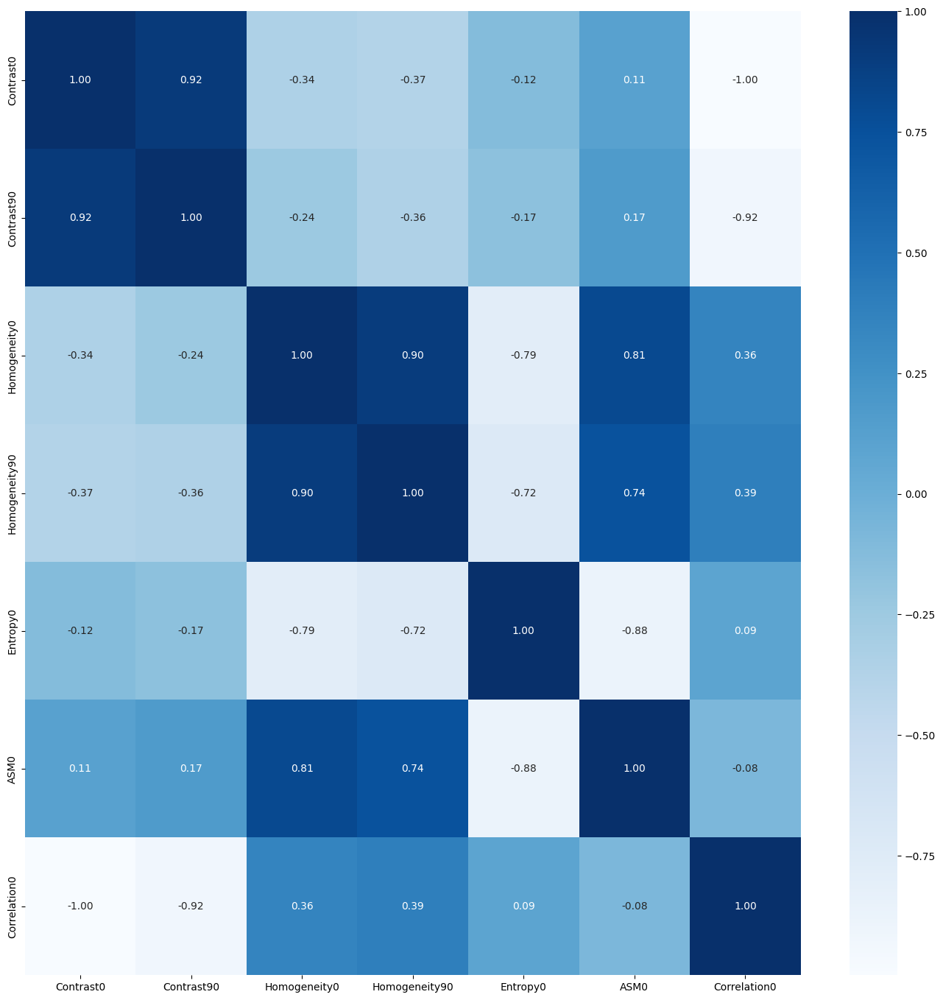

In [11]:
# Menghitung korelasi
correlation = hasilEkstrak.drop(columns=['Label','Filename']).corr()

# Menyaring fitur yang memiliki korelasi absolut lebih dari 0.95 dengan label
threshold = 0.95 # atur threshold ini untuk menentukan seberapa besar korelasi yang ingin disaring
selectionFeature = []
columns = np.full((correlation.shape[0],), True, dtype=bool)
for i in range(correlation.shape[0]):
	for j in range(i+1, correlation.shape[0]):
		if correlation.iloc[i,j] >= threshold:
			if columns[j]:
				columns[j] = False
select = hasilEkstrak.drop(columns=['Label','Filename']).columns[columns]
x_new = hasilEkstrak[select]
x_new
y = hasilEkstrak['Label']
plt.figure(figsize=(17,17))
sns.heatmap(x_new.corr(), annot=True, cmap='Blues', fmt=".2f")

## Splitting Data

In [12]:
# ubah bagian test_size sesuai kebutuhan
# 0.3 = 30% data untuk testing (train/test 70/30)
# 0.2 = 20% data untuk testing (train/test 80/20)
X_train, X_test, y_train, y_test = train_test_split(x_new, y, test_size=0.2, random_state=42)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(1005, 7)
(252, 7)
(1005,)
(252,)


## Feature Normalization

In [13]:
# normalisasi mean std (Standardization / Z-score normalization)
X_test = (X_test - X_train.mean()) / X_train.std()
X_train = (X_train - X_train.mean()) / X_train.std()

## Modeling

### Define Model

In [14]:
def generateClassificationReport(y_true, y_pred):
	print(classification_report(y_true, y_pred))
	print(confusion_matrix(y_true, y_pred))
	print('Accuracy:', accuracy_score(y_true, y_pred))

# Define classifiers
rf = RandomForestClassifier(n_estimators=5, random_state=42)
svm = SVC(kernel='rbf', random_state=42)
knn = KNeighborsClassifier(n_neighbors=5)

### Train Random Forest Classifier

In [15]:
# Train Random Forest Classifier
rf.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("------Training Set------")
y_pred = rf.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = rf.predict(X_test)
generateClassificationReport( y_test, y_pred)

------Training Set------
              precision    recall  f1-score   support

       akiec       0.91      0.97      0.94       160
         bcc       0.93      0.93      0.93       153
         bkl       0.87      0.94      0.90       158
          df       0.89      0.90      0.90        93
         mel       0.95      0.92      0.93       170
          nv       0.96      0.93      0.94       156
        vasc       0.93      0.82      0.87       115

    accuracy                           0.92      1005
   macro avg       0.92      0.92      0.92      1005
weighted avg       0.92      0.92      0.92      1005

[[155   1   3   0   0   1   0]
 [  5 143   1   2   0   1   1]
 [  4   1 148   0   1   0   4]
 [  2   1   6  84   0   0   0]
 [  3   2   8   0 156   0   1]
 [  0   2   1   5   2 145   1]
 [  2   4   3   3   5   4  94]]
Accuracy: 0.9203980099502488

------Testing Set------
              precision    recall  f1-score   support

       akiec       0.32      0.47      0.38        

### Train SVM Classifier

In [16]:
# Train SVM Classifier
svm.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("\n------Training Set------")
y_pred = svm.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = svm.predict(X_test)
generateClassificationReport( y_test, y_pred)


------Training Set------


c:\Users\User\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\User\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\User\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modif

              precision    recall  f1-score   support

       akiec       0.34      0.60      0.43       160
         bcc       0.35      0.23      0.28       153
         bkl       0.38      0.22      0.28       158
          df       0.00      0.00      0.00        93
         mel       0.32      0.38      0.35       170
          nv       0.40      0.56      0.47       156
        vasc       0.42      0.39      0.41       115

    accuracy                           0.36      1005
   macro avg       0.32      0.34      0.32      1005
weighted avg       0.33      0.36      0.33      1005

[[96 15 12  0 23  8  6]
 [49 35 10  0 22 22 15]
 [50 12 35  0 31 19 11]
 [24 14  8  0 29 14  4]
 [40  6 13  0 65 38  8]
 [10  9 11  0 20 88 18]
 [13  8  3  0 14 32 45]]
Accuracy: 0.36218905472636814

------Testing Set------
              precision    recall  f1-score   support

       akiec       0.38      0.68      0.48        40
         bcc       0.30      0.17      0.22        47
         bkl    

c:\Users\User\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\User\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


### Train KNN Classifier

In [17]:
# Train KNN Classifier
knn.fit(X_train, y_train)

# Make predictions and evaluate the model with the training set
print("\n------Training Set------")
y_pred = knn.predict(X_train)
generateClassificationReport( y_train, y_pred)

# Make predictions and evaluate the model with the testing set
print("\n------Testing Set------")
y_pred = knn.predict(X_test)
generateClassificationReport( y_test, y_pred)



------Training Set------
              precision    recall  f1-score   support

       akiec       0.43      0.72      0.54       160
         bcc       0.45      0.54      0.49       153
         bkl       0.46      0.36      0.40       158
          df       0.52      0.39      0.44        93
         mel       0.54      0.45      0.49       170
          nv       0.57      0.47      0.52       156
        vasc       0.53      0.40      0.46       115

    accuracy                           0.48      1005
   macro avg       0.50      0.48      0.48      1005
weighted avg       0.50      0.48      0.48      1005

[[116  10   8   6  12   5   3]
 [ 28  82  13   4   8   6  12]
 [ 45  25  57   3  15   6   7]
 [ 19  17  11  36   6   2   2]
 [ 35  15  11   9  77  16   7]
 [ 17  15  19   5  17  73  10]
 [ 12  18   6   6   8  19  46]]
Accuracy: 0.4845771144278607

------Testing Set------
              precision    recall  f1-score   support

       akiec       0.31      0.53      0.39       

## Evaluasi Dengan Confussion Matrix

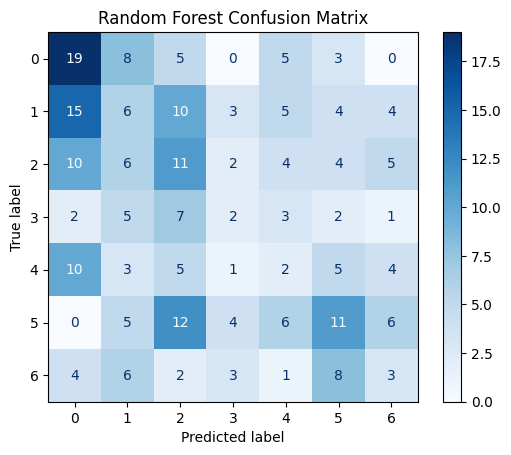

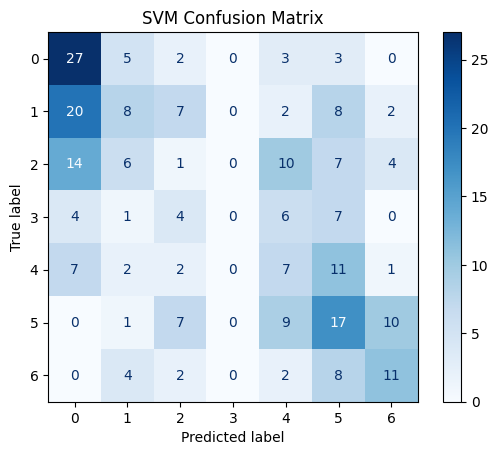

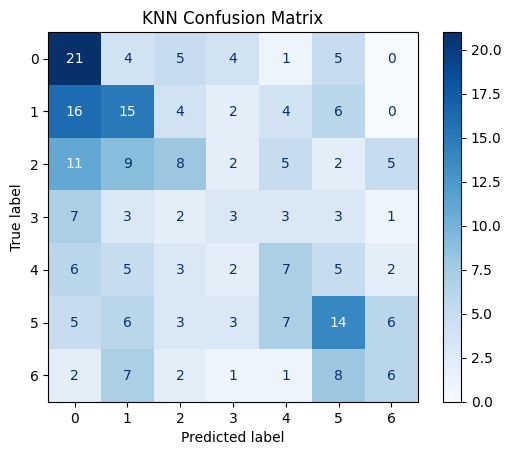

In [18]:
def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title(title)
    plt.show()

# Plot confusion matrix for Random Forest
plot_confusion_matrix(y_test, rf.predict(X_test), "Random Forest Confusion Matrix")
# Plot confusion matrix for SVM
plot_confusion_matrix(y_test, svm.predict(X_test), "SVM Confusion Matrix")
# Plot confusion matrix for KNN
plot_confusion_matrix(y_test, knn.predict(X_test), "KNN Confusion Matrix")